#Реализация DQN (Deep Q-Network) для Atari Pong (OpenAI Gym)

По мотивом [статьи](https://torres.ai/deep-reinforcement-learning-explained-series/) Jordi Torres по обучению с подкреплением.<br>

В серии своих статей профессор Торрес разбирает алгоритм обучения с подкреплением для игры в Понг, однако его алгоритм написан на фреймворке Torch с ручным обучением. Я переписал его для TensorFlow с обучением методом `train_on_batch`. Ссылка на оригинальный ноутбук Colab [тут](https://colab.research.google.com/github/jorditorresBCN/Deep-Reinforcement-Learning-Explained/blob/master/DRL_15_16_17_DQN_Pong.ipynb#scrollTo=qEoc2PWmM2mu).

Помимо непосредственно обучения, код, приведенный Торресом, включает в себя несколько удобных классов-оберток для фреймворка `gym`, упрощающих работу с ним.<br>
Кроме того, в коде используются все основные приемы для улучшения качества модели: epsilon-greedy подход, experience replay и target network.



#### Импорт, константы.


`MEAN_REWARD_BOUND`: среднее значение награды, после которого мы остановим обучение <br>
`gamma`: параметр дисконтирования <br>
`batch_size`: размер батча для обучения <br>
`replay_size`: размер буфера experience replay <br>
`learning_rate`: скорость обучения <br>
`sync_target_frames`: частота, с которой мы будем обновлять веса в нашей вспомогательной модели <br>
`replay_start_size`: размер буфера, по достижении которого мы начнем обучение сети <br>
`eps_start`: начальная величина epsilon <br>
`eps_decay`: величина, на которую будет уменьшаться epsilon каждую итерацию основного цикла <br>
`eps_min`: минимальная величина epsilon; по ее достижении уменьшаться значение уже не будет <br>

In [ ]:
import gym
import gym.spaces
import time
import numpy as np
import collections
import cv2
import tensorflow as tf
from google.colab import drive
drive.mount('/content/drive/')

!python -m atari_py.import_roms /content/drive/MyDrive/ROMS

MEAN_REWARD_BOUND = 19.0           

gamma = 0.99                   
batch_size = 32                
replay_size = 10000            
learning_rate = 1e-4           
sync_target_frames = 1000      
replay_start_size = 10000      

eps_start=1.0
eps_decay=.999985
eps_min=0.02

env = gym.make('PongNoFrameskip-v4')
n_actions = env.action_space.n
print(n_actions)

Mounted at /content/drive/
copying pong.bin from /content/drive/MyDrive/ROMS/Video Olympics - Pong Sports (Paddle) (1977) (Atari, Joe Decuir - Sears) (CX2621 - 99806, 6-99806, 49-75104) ~.bin to /usr/local/lib/python3.7/dist-packages/atari_py/atari_roms/pong.bin
6


Мы будем обучать нашу модель на полном диапазоне действий (6 шт.). Некоторые реализации оставляют только обучение на двух действиях: вверх и вниз. Причина, по которой мы оставляем полный диапазон, в том, что оригинальная статья, на которую ссылается Торрес, реализовала модель DQN для **всех** игр на Atari, существующих в пакете `gym`. Поэтому работа с полным диапазоном более универсальна.

In [ ]:
print(env.unwrapped.get_action_meanings())

['NOOP', 'FIRE', 'RIGHT', 'LEFT', 'RIGHTFIRE', 'LEFTFIRE']


In [ ]:
print(env.observation_space.shape)

(210, 160, 3)


## Методы для OpenAI Gym.

В самом конце ячейки ниже мы определяем функцию `make_env`, которая последовательно применяет к созданной игре следующие действия: <br><br>

1.   Класс `MaxAndSkipEnv`. Свойство эмулятора Atari в модуле Gym: после "нажатия на геймпад" (выбора действия), модель делает следующие 2-4 кадра (случайно выбирается каждый раз) как реакцию на это действие, т.е. в течение этих 2-4 кадров нажатия на кнопки игнорируются. Поэтому, по сути, в этих четырех кадрах одинаковая информация о действии, и мы можем взять максимум по всем четырем кадрам для уменьшения количества значимой информации, а значит и используемых ресурсов. Далее, помимо этого, мы решаем проблему с "мерцанием", которое существует на Atari и было перенесено в эмулятор. Для этого мы берем максимальное значение по каждому пикселю в последних двух кадрах и записываем его в получившийся тензор.
2.   Класс `FireResetEnv`. Здесь всё просто: игра начинается тогда, когда игрок нажимает на кнопку "Fire". Этот класс "нажимает" кнопку за нас.
3.   Класс `ProcessFrame84`. Мы получаем полноцветное изображение размером 210х160х3 из игры. Во-первых, на этом изображении есть лишняя информация: счёт в верхней части игры. Во-вторых, для нейросети не нужно три канала, хватит и одного. В-третьих, для экономии памяти и вычислительных ресурсов, мы можем уменьшить размер изображения в два раза. Авторы оригинальной модели предложили размер 84x84x1, именно в такой размер и переводит нашу игру этот метод.
4.   Класс `ImageToTensor`. Для Torch нужно было пересобрать тензор и переместить цветовой канал на первое место. Я оставил этот метод для совместимости, и учел перенос каналов в дальнейшем, во время создания самой модели.
5.   Класс `BufferWrapper`. Предполагается, что на вход в нашу модель подаются изображения с экрана, т.е. статичная картинка (в нашем случае размером 210х160х3). Но, согласно [Марковскому свойству](https://en.wikipedia.org/wiki/Markov_property), процесс обучения с подкреплением не обладает памятью, т.е. модель должна принимать решение в каждый момент времени только на основании данных, которые подаются в нее в этот же момент времени. Если мы будем подавать в модель только статичную картинку, как она поймет, в какую сторону двигается летящий мяч? Решением этой проблемы является подача в модель сразу четырех изображений подряд, как одного 4-х мерного тензора, который будет содержать в себе информацию о движении.



In [ ]:
import cv2
import numpy as np
import collections

class FireResetEnv(gym.Wrapper):
    def __init__(self, env=None):
        super(FireResetEnv, self).__init__(env)
        assert env.unwrapped.get_action_meanings()[1] == 'FIRE'
        assert len(env.unwrapped.get_action_meanings()) >= 3

    def step(self, action):
        return self.env.step(action)

    def reset(self):
        self.env.reset()
        obs, _, done, _ = self.env.step(1)
        if done:
            self.env.reset()
        obs, _, done, _ = self.env.step(2)
        if done:
            self.env.reset()
        return obs

class MaxAndSkipEnv(gym.Wrapper):
    def __init__(self, env=None, skip=4):
        super(MaxAndSkipEnv, self).__init__(env)
        # most recent raw observations (for max pooling across time steps)
        self._obs_buffer = collections.deque(maxlen=2)
        self._skip = skip

    def step(self, action):
        total_reward = 0.0
        done = None
        for _ in range(self._skip):
            obs, reward, done, info = self.env.step(action)
            self._obs_buffer.append(obs)
            total_reward += reward
            if done:
                break
        max_frame = np.max(np.stack(self._obs_buffer), axis=0)
        return max_frame, total_reward, done, info

    def reset(self):
        self._obs_buffer.clear()
        obs = self.env.reset()
        self._obs_buffer.append(obs)
        return obs


class ProcessFrame84(gym.ObservationWrapper):
    def __init__(self, env=None):
        super(ProcessFrame84, self).__init__(env)
        self.observation_space = gym.spaces.Box(low=0, high=255, shape=(84, 84, 1), dtype=np.uint8)

    def observation(self, obs):
        return ProcessFrame84.process(obs)

    @staticmethod
    def process(frame):
        if frame.size == 210 * 160 * 3:
            img = np.reshape(frame, [210, 160, 3]).astype(np.float32)
        elif frame.size == 250 * 160 * 3:
            img = np.reshape(frame, [250, 160, 3]).astype(np.float32)
        else:
            assert False, "Unknown resolution."
        img = img[:, :, 0] * 0.299 + img[:, :, 1] * 0.587 + img[:, :, 2] * 0.114
        resized_screen = cv2.resize(img, (84, 110), interpolation=cv2.INTER_AREA)
        x_t = resized_screen[18:102, :]
        x_t = np.reshape(x_t, [84, 84, 1])
        return x_t.astype(np.uint8)


class BufferWrapper(gym.ObservationWrapper):
    def __init__(self, env, n_steps, dtype=np.float32):
        super(BufferWrapper, self).__init__(env)
        self.dtype = dtype
        old_space = env.observation_space
        self.observation_space = gym.spaces.Box(old_space.low.repeat(n_steps, axis=0),
                                                old_space.high.repeat(n_steps, axis=0), dtype=dtype)

    def reset(self):
        self.buffer = np.zeros_like(self.observation_space.low, dtype=self.dtype)
        return self.observation(self.env.reset())

    def observation(self, observation):
        self.buffer[:-1] = self.buffer[1:]
        self.buffer[-1] = observation
        return self.buffer


class ImageToTensor(gym.ObservationWrapper):
    def __init__(self, env):
        super(ImageToTensor, self).__init__(env)
        old_shape = self.observation_space.shape
        self.observation_space = gym.spaces.Box(low=0.0, high=1.0, shape=(old_shape[-1], 
                                old_shape[0], old_shape[1]), dtype=np.float32)

    def observation(self, observation):
        return np.moveaxis(observation, 2, 0)


class ScaledFloatFrame(gym.ObservationWrapper):
    def observation(self, obs):
        return np.array(obs).astype(np.float32) / 255.0

def make_env(env_name):
    env = gym.make(env_name)
    env = MaxAndSkipEnv(env)
    env = FireResetEnv(env)
    env = ProcessFrame84(env)
    env = ImageToTensor(env)
    env = BufferWrapper(env, 4)
    return ScaledFloatFrame(env)

## Модель DQN 


Модель полностью повторяет архитектуру, предложенную авторами оригинальной статьи, и изначально реализованную на Torch: три сверточных слоя, один полносвязный слой с 256 нейронами, и выходной слой, у которого количество нейронов равно количеству действий.

Обратите внимание: помимо основной модели, мы еще создадим вспомогательную модель target_model. Для чего? <br>

В процессе обучения Q-сетей, мы обновляем наши _предположительные_ значения actions, с помощью таких же _предположительных_ значений, и повторяем это итеративно много раз. Это может приводить к появлению нежелательных корреляций, т.к. между состоянием s и следующим состоянием s' всего один шаг, и данные уже скоррелированы. Для того, чтобы стабилизировать процесс обучения, мы создаем вспомогательную сеть, в которой мы храним копию весов нашей основной обучаемой сети, и с помощью которой мы генерируем следующее состояние s' в уравнении Беллмана (s, a, r, s'). Эта сеть не обучается, а лишь периодически в нее копируются веса из основной модели (гиперпараметр `sync_target_frames` определяет, через сколько кадров нужно обновлять веса).

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=32, kernel_size=(8, 8), strides=(4, 4),
                           activation='relu', input_shape=(4, 84, 84), data_format='channels_first'),
    tf.keras.layers.Conv2D(filters=64, kernel_size=(4, 4), strides=(2, 2),
                           activation='relu', data_format='channels_first'),
    tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), strides=(1, 1), 
                           activation='relu', data_format='channels_first'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(n_actions)
])

model.summary()

def loss(q1, q2):
    return tf.reduce_sum(tf.square(q1 - q2))

optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
#optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4, beta_1=0.5, beta_2=0.999, epsilon=1e-1)


model.compile(loss=loss, optimizer=optimizer)

target_model = tf.keras.models.clone_model(model)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 32, 20, 20)        8224      
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 64, 9, 9)          32832     
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 64, 7, 7)          36928     
_________________________________________________________________
flatten_1 (Flatten)          (None, 3136)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               803072    
_________________________________________________________________
dense_3 (Dense)              (None, 6)                 1542      
Total params: 882,598
Trainable params: 882,598
Non-trainable params: 0
________________________________________________

## Обучение

Теперь посмотрим, как реализован метод Experience Replay. Напомним, что наша игра - это последовательность кадров, каждый следующий из которых очень похож на предыдущий. Если подавать такие последовательности в сеть, обучение пойдет плохо, т.к. будет ловить нежелательные корреляции. Чтобы этого избежать, мы формируем буфер, в который записываем состояния игры, а потом случайным образом выбираем из буфера определенное число состояний (`batch_size`), и подаем их в модель.<br>
Мы будем формировать буфер размером `replay_size`, а когда буфер заполнится, мы будем стирать самые ранние записи, и записывать новые по принципу FIFO (с помощью объекта deque из библиотеки collections).

In [ ]:
Experience = collections.namedtuple('Experience', field_names=['state', 'action', 'reward', 'done', 'new_state'])

class ExperienceReplay:
    def __init__(self, capacity):
        self.buffer = collections.deque(maxlen=capacity)

    def __len__(self):
        return len(self.buffer)

    def append(self, experience):
        self.buffer.append(experience)

    def sample(self, batch_size):
        indices = np.random.choice(len(self.buffer), batch_size, replace=False)
        states, actions, rewards, dones, next_states = zip(*[self.buffer[idx] for idx in indices])
        return np.array(states), np.array(actions), np.array(rewards, dtype=np.float32), \
               np.array(dones, dtype=np.uint8), np.array(next_states)


Класс `Agent` - удобная обертка для реализации одного шага игры. Мы не можем теперь просто взять и сделать один шаг с помощью env.step(), т.к. у нас теперь появились дополнительные методы: стэк из нескольких состояний, experience replay. С помощью класса мы реализуем эти методы и в дальнейшем будем вызывать только метод `play_step`, который будет делать всё за нас.

In [ ]:
class Agent:
    def __init__(self, env, exp_buffer):
        self.env = env
        self.exp_buffer = exp_buffer
        self._reset()

    def _reset(self):
        self.state = env.reset()
        self.total_reward = 0.0

    def play_step(self, model, epsilon=0.0):

        done_reward = None
        if np.random.random() < epsilon:
            action = env.action_space.sample()
        else:
            q_s = model(self.state[np.newaxis, ...]).numpy()[0]
            action = np.argmax(q_s)

        new_state, reward, is_done, _ = self.env.step(action)
        self.total_reward += reward

        exp = Experience(self.state, action, reward, is_done, new_state)
        self.exp_buffer.append(exp)
        self.state = new_state
        if is_done:
            done_reward = self.total_reward
            self._reset()
        return done_reward


Основной цикл обучения.<br>
Мы будем отслеживать сумму наград, и считать среднее среди последних 100 наград, записанных в массив `total_rewards`. Когда новое среднее будет обновлять максимальный рекорд, мы будем выводить его на экран.<br>
Мы не ограничиваем количество циклов, а продолжаем обучение до тех пор, пока среднее среди последних 100 наград не станет равно нашему параметру `MEAN_REWARD_BOUND`.<br>
Дальше процесс очень похож на то, что мы делали ранее в практических заданиях. Единственное отличие: теперь мы передаем в модель не одно наблюдение, а батч. Поэтому на выходе из модели у нас получается тензор размером `(batch_size, n_actions)`, в котором нужно обновлять те значения, которые соответствуют нужным действиям, полученным в результате инференса из модели. 

In [ ]:
env = make_env('PongNoFrameskip-v4')

buffer = ExperienceReplay(replay_size)
agent = Agent(env, buffer)

epsilon = eps_start # epsilon-greedy начальное значение

total_rewards = []
frame_idx = 0  

best_mean_reward = None

while True:
    frame_idx += 1
    epsilon = max(epsilon*eps_decay, eps_min)

    reward = agent.play_step(model, epsilon)
    if reward is not None:
        total_rewards.append(reward)

        mean_reward = np.mean(total_rewards[-100:])

        print("%d:  %d games, mean reward %.3f, (epsilon %.2f)" % (
            frame_idx, len(total_rewards), mean_reward, epsilon))
        
        if best_mean_reward is None or best_mean_reward < mean_reward:
            
            best_mean_reward = mean_reward
            if best_mean_reward is not None:
                print("Best mean reward updated %.3f" % (best_mean_reward))

        if mean_reward > MEAN_REWARD_BOUND:
            print("Solved in %d frames!" % frame_idx)
            break

    if len(buffer) < replay_start_size: # не обучаем модель, пока не набрали
        # буфер experience replay
        continue

    batch = buffer.sample(batch_size) # сэмплируем из буфера наши изображения
    states, actions, rewards, dones, next_states = batch

    action_values = model(states)

    next_action_values = target_model(next_states)
    
    state_action_values = tf.where(dones, rewards, rewards + gamma * tf.math.reduce_max(next_action_values, axis=1))
    
    indices = tf.range(state_action_values.shape[0], dtype=tf.int32)
    
    state_action_indices = tf.transpose(tf.stack([indices, actions]))

    state_action_tensor = tf.tensor_scatter_nd_update(action_values, state_action_indices, state_action_values)
    
    model.train_on_batch(states, state_action_tensor)

    if frame_idx % sync_target_frames == 0:
        target_model.set_weights(model.get_weights())


1019:  1 games, mean reward -20.000, (epsilon 0.98)
Best mean reward updated -20.000
1837:  2 games, mean reward -20.500, (epsilon 0.97)
2756:  3 games, mean reward -20.333, (epsilon 0.96)
3658:  4 games, mean reward -20.500, (epsilon 0.95)
4420:  5 games, mean reward -20.600, (epsilon 0.94)
5480:  6 games, mean reward -20.500, (epsilon 0.92)
6392:  7 games, mean reward -20.571, (epsilon 0.91)
7246:  8 games, mean reward -20.625, (epsilon 0.90)
8254:  9 games, mean reward -20.667, (epsilon 0.88)
9104:  10 games, mean reward -20.700, (epsilon 0.87)
9966:  11 games, mean reward -20.727, (epsilon 0.86)
10756:  12 games, mean reward -20.750, (epsilon 0.85)
11705:  13 games, mean reward -20.692, (epsilon 0.84)
12615:  14 games, mean reward -20.714, (epsilon 0.83)
13556:  15 games, mean reward -20.733, (epsilon 0.82)
14318:  16 games, mean reward -20.750, (epsilon 0.81)
15200:  17 games, mean reward -20.765, (epsilon 0.80)
16174:  18 games, mean reward -20.722, (epsilon 0.78)
16964:  19 game

In [ ]:
model.save_weights('/content/drive/MyDrive/Skillbox/pong_model/model')

## Запуск игры.

Вспомогательный код для запуска видео в колабе (из кода Торреса).

In [ ]:
DEFAULT_ENV_NAME = "PongNoFrameskip-v4"
FPS = 25

In [ ]:
!apt-get install -y xvfb x11-utils

!pip install pyvirtualdisplay==0.2.* \
             PyOpenGL==3.1.* \
             PyOpenGL-accelerate==3.1.*

!pip install gym[box2d]==0.17.*

import pyvirtualdisplay

_display = pyvirtualdisplay.Display(visible=False, size=(1400, 900))
_ = _display.start()

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  libxxf86dga1
Suggested packages:
  mesa-utils
The following NEW packages will be installed:
  libxxf86dga1 x11-utils xvfb
0 upgraded, 3 newly installed, 0 to remove and 39 not upgraded.
Need to get 994 kB of archives.
After this operation, 2,981 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 libxxf86dga1 amd64 2:1.1.4-1 [13.7 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/main amd64 x11-utils amd64 7.7+3build1 [196 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic-updates/universe amd64 xvfb amd64 2:1.19.6-1ubuntu4.9 [784 kB]
Fetched 994 kB in 0s (9,240 kB/s)
Selecting previously unselected package libxxf86dga1:amd64.
(Reading database ... 160772 files and directories currently installed.)
Preparing to unpack .../libxxf86dga1_2%3a1.1.4-1_amd64.deb ...
Unpacking libxxf86dga1:amd64 (2:

In [ ]:
record_folder="/content/drive/MyDrive/Skillbox/pong_model/video"  
visualize=True

env = make_env(DEFAULT_ENV_NAME)
if record_folder:
        env = gym.wrappers.Monitor(env, record_folder, force=True)

state = env.reset()
total_reward = 0.0

while True:
        start_ts = time.time()
        if visualize:
            env.render()
        
        q_vals = model(state[np.newaxis, ...]).numpy()[0]
        action = np.argmax(q_vals)
        
        state, reward, done, _ = env.step(action)
        total_reward += reward
        if done:
            break
        if visualize:
            delta = 1/FPS - (time.time() - start_ts)
            if delta > 0:
                time.sleep(delta)
print("Total reward: %.2f" % total_reward)

if record_folder:
        env.close()

Total reward: 21.00


###### Просмотр получившегося видео

In [ ]:
def show_video():
    import glob
    import io
    import base64
    from IPython.display import HTML
    from IPython import display as ipythondisplay

    mp4list = glob.glob('/content/drive/MyDrive/Skillbox/pong_model/video/*.mp4')
    if len(mp4list) > 0:
        mp4 = mp4list[0]
        print(mp4)
        video = io.open(mp4, 'r+b').read()
        encoded = base64.b64encode(video)
        ipythondisplay.display(HTML(data='''<video alt="test" autoplay 
            loop controls style="height: 400px;">
            <source src="data:video/mp4;base64,{0}" type="video/mp4" />
            </video>'''.format(encoded.decode('ascii'))))
    else: 
        print("Could not find video")

show_video()

/content/drive/MyDrive/Skillbox/pong_model/video/openaigym.video.8.61.video000000.mp4


Конвертируем видео в gif. Предварительно полученное видео для истории пересохранил в родительскую директорию и переименовал в удобный вид.


[MoviePy] Building file /content/drive/MyDrive/Skillbox/DQN_Pong.gif with imageio


100%|█████████▉| 1620/1621 [00:09<00:00, 164.15it/s]


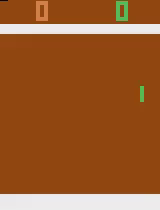

In [ ]:
from moviepy.editor import *

clip = (VideoFileClip("/content/drive/MyDrive/Skillbox/DQN_Pong.mp4")
        .subclip((0,0),(0,54))
        .resize(1))
clip.write_gif("/content/drive/MyDrive/Skillbox/DQN_Pong.gif")

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from IPython import display
gifPath = "/content/drive/MyDrive/Skillbox/DQN_Pong.gif"
# Display GIF in Jupyter, CoLab, IPython
with open(gifPath,'rb') as f:
    display.Image(data=f.read(), format='png')